## Problem

- Harga property dipengaruhi banyak faktor seperti lokasi, ukuran, dan kondisi. Faktor tersebut yang menjadi pembeda value dari tiap properti
- Market properti sendiri cukup volatile dan bergantung pada supply dan demand, tidak hanya faktor ekonomi seperti suku bunga dan inflasi. Hal ini yang membuat prediksi menjadi cukup challenging setiap waktu dan data yang terbatas
- Dengan data yang terbatas, kebanyakan dataset memiliki fitur yang terbatas pada tiap properti. Maka feature engineering cukup penting
- Cukup sulit memprediksi harga properti secara akurat dengan mempertimbangkan faktor yang mempengaruhi

## Objective
- Model dapat memprediksi `median_house_value` yang menjadi target
- Impute data yang kosong
- Analytic approach yang dilakukan adalah regresi

## Data Collect

- Dataset merupakan data sensus di kota California pada tahun 1990.

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from geopy.geocoders import Nominatim
from folium.plugins import MarkerCluster

from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, KFold
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

import statsmodels.api as sm
from scipy.stats import normaltest
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV

In [5]:
df = pd.read_csv('data_california_house.csv')
df.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0
5,-117.79,33.80,11.0,10535.0,1620.0,4409.0,1622.0,6.6700,<1H OCEAN,283200.0
6,-117.80,33.81,14.0,1206.0,142.0,572.0,149.0,8.8470,<1H OCEAN,388700.0
7,-121.26,38.69,17.0,3917.0,638.0,1809.0,564.0,5.2586,INLAND,137000.0
8,-117.65,33.48,6.0,1638.0,188.0,572.0,174.0,13.0502,<1H OCEAN,500001.0
9,-122.27,37.97,10.0,15259.0,2275.0,7266.0,2338.0,6.0666,NEAR BAY,272400.0


## EDA

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


terdapat 137 row data null pada kolom `total_bedrooms` 

**Attributes Information**

| **Attribute** | **Data Type** | **Description** |
| --- | --- | --- |
| latitude | Float | Latitude coordinates |
| longitude | Float | Longitude coordinates |
| housing_median_age | Float | Median age of a house within a block; a lower number is a newer building.|
| total_rooms | Float | Total number of rooms within a block|
| total_bedrooms | Float | Total number of bedrooms within a block|
| population | Float | Total number of people residing within a block|
| households | Float | Total number of households, a group of people residing within a home unit, for a block|
| median_income | Float | Median income for households within a block of houses (measured in tens of thousands of US Dollars)|
| median_house_value | Float | Median house value for households within a block (measured in US Dollars)|
| ocean_proximity | Object | Location of the house with respect to the ocean/sea|

In [7]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [8]:
df.describe(include='object')

,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


In [9]:
for i in df.describe(include='object').columns:
    print(i, '\n', df[i].unique(), '\n')

ocean_proximity 
 ['INLAND' 'NEAR BAY' '<1H OCEAN' 'NEAR OCEAN' 'ISLAND'] 



- <1H OCEAN: Menunjukkan bahwa rumah tersebut berlokasi dalam jarak satu jam perjalanan dari laut.
- INLAND: Menandakan bahwa rumah tersebut terletak jauh dari laut, biasanya di daerah pedalaman.
- NEAR OCEAN: Menunjukkan bahwa rumah tersebut relatif dekat dengan laut tetapi tidak berada di wilayah pesisir langsung.
- NEAR BAY: Mengimplikasikan bahwa rumah tersebut terletak di dekat teluk, yaitu sebuah teluk di laut.
- ISLAND: Menunjukkan bahwa rumah tersebut terletak di sebuah pulau.

ocean_proximity
<1H OCEAN     6369
INLAND        4576
NEAR OCEAN    1879
NEAR BAY      1622
ISLAND           2
Name: count, dtype: int64


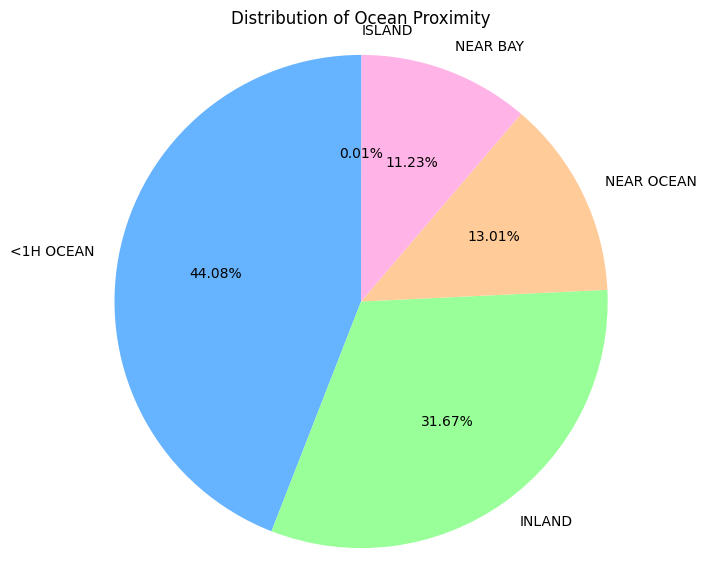

In [10]:
ocean_proximity_counts = df['ocean_proximity'].value_counts()
print(ocean_proximity_counts)
plt.figure(figsize=(7, 7))
plt.pie(ocean_proximity_counts, labels=ocean_proximity_counts.index, autopct='%1.2f%%',
        startangle=90, colors=['#66b3ff', '#99ff99', '#ffcc99', '#ffb3e6'])
plt.title('Distribution of Ocean Proximity')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [11]:
geolocator = Nominatim(user_agent='my_geocoder')
california = geolocator.geocode('California')
map_california = folium.Map(
    location=[california.latitude, california.longitude], zoom_start=4.5)
marker_cluster = MarkerCluster().add_to(map_california)
for index, row in df.iterrows():
    if row['population'] > 800000:
        color = 'red' 
    elif row['population'] > 50000:
        color = 'medium' 
    else:
        color = 'green' 
    
    folium.Marker(location=[row['latitude'], row['longitude']],
                  icon=folium.Icon(color=color, icon='info-sign')).add_to(marker_cluster)
map_california

Rumah paling banyak di daerah Los Angeles dan San Jose

In [12]:
df[df['total_bedrooms'].isna()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
88,-121.47,38.61,31.0,1072.0,NaN,781.0,281.0,1.6563,INLAND,65800.0
119,-117.28,34.26,18.0,3895.0,NaN,1086.0,375.0,3.3672,INLAND,133600.0
251,-117.61,34.08,12.0,4427.0,NaN,2400.0,843.0,4.7147,INLAND,158700.0
340,-122.70,38.35,14.0,2313.0,NaN,954.0,397.0,3.7813,<1H OCEAN,146500.0
410,-122.42,40.44,16.0,994.0,NaN,495.0,181.0,2.1875,INLAND,76400.0
...,...,...,...,...,...,...,...,...,...,...
13856,-117.96,34.03,35.0,2093.0,NaN,1755.0,403.0,3.4115,<1H OCEAN,150400.0
13932,-117.87,33.83,27.0,2287.0,NaN,1140.0,351.0,5.6163,<1H OCEAN,231000.0
13989,-118.40,34.17,24.0,6347.0,NaN,2945.0,1492.0,3.3545,<1H OCEAN,221500.0
14308,-118.55,34.19,18.0,5862.0,NaN,3161.0,1280.0,3.1106,<1H OCEAN,170600.0


Sebanyak 137 data yang `total_bedrooms` NaN dengan pola random

In [13]:
df.duplicated().sum()

np.int64(0)

In [14]:
df['ocean_proximity'] = df['ocean_proximity'].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           14448 non-null  float64 
 1   latitude            14448 non-null  float64 
 2   housing_median_age  14448 non-null  float64 
 3   total_rooms         14448 non-null  float64 
 4   total_bedrooms      14311 non-null  float64 
 5   population          14448 non-null  float64 
 6   households          14448 non-null  float64 
 7   median_income       14448 non-null  float64 
 8   ocean_proximity     14448 non-null  category
 9   median_house_value  14448 non-null  float64 
dtypes: category(1), float64(9)
memory usage: 1.0 MB


Merubah data type `ocean_proximity` menjadi category untuk meningkatkan performa komputasi

[Reference](https://stackoverflow.com/questions/30601830/when-to-use-category-rather-than-object)

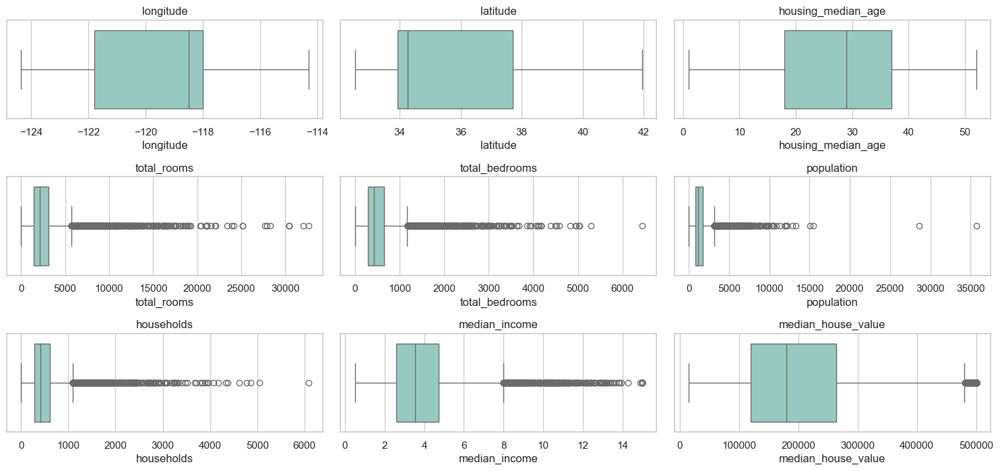

In [15]:
num_feature = [fea for fea in df.describe().columns]
plotnumber = 1
plt.figure(figsize=(15, 9), facecolor='white')
sns.set(style='whitegrid', palette='Set3')
for feature in num_feature:
    ax = plt.subplot(4, 3, plotnumber)
    sns.boxplot(x=feature, data=df)
    plt.title(feature, fontsize=12)
    plt.tight_layout()
    plotnumber += 1

Terdapat banyak outlier pada kolom `total_rooms`, `total_bedrooms`, `population`, `households`, dan `median_income`

<Axes: >

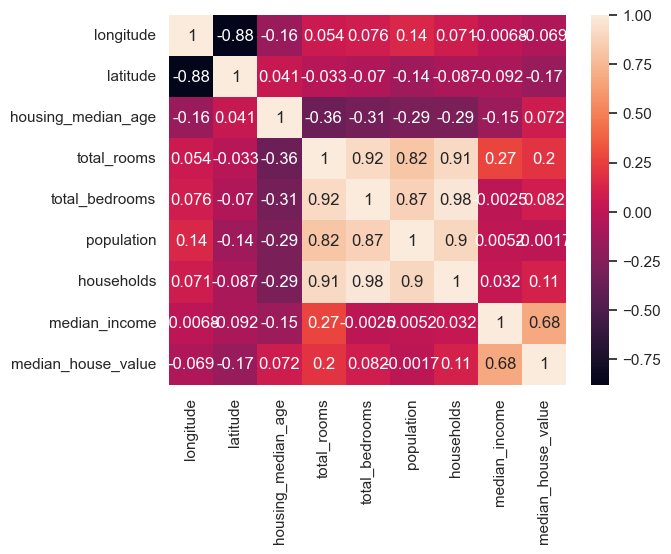

In [16]:
corr = df.select_dtypes('float64').corr('spearman')
sns.heatmap(corr, annot=True)

Korelasi kuat terjadi antar kolom: 
1. `total_bedrooms` dan `households` 98%
2. `total_rooms` dan `households` 91%
3. `total_rooms` dan `total_bedroom` 92%
4. `total_bedrooms` dan `population` 87%
5. `total_rooms` dan `population` 82%
6. `median_income` dan `median_house_value` 68%

Korelasi signifikan terjadi antara total_bedrooms, households, total_rooms, dan population, serta korelasi sedang antara median_income dan median_house_value, sebagaimana dibuktikan oleh koefisien korelasi yang berkisar dari 68% hingga 98%.

Melihat distribusi data `median_house_value` dan `median_income`

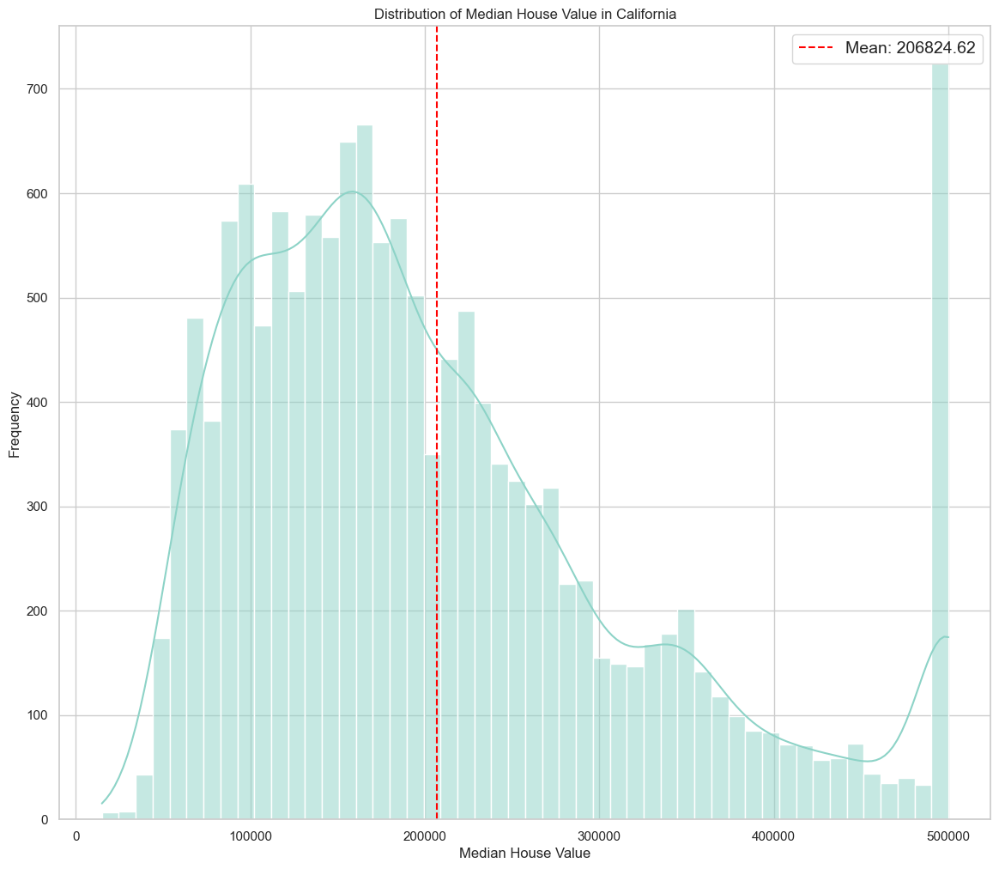

In [17]:
plt.figure(figsize=(14, 12))
sns.histplot(data=df, x='median_house_value', kde=True, bins=50)

plt.xlabel('Median House Value')
plt.ylabel('Frequency')
plt.title('Distribution of Median House Value in California')

mean = df['median_house_value'].mean()

plt.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')

plt.legend(fontsize=14)
plt.show()

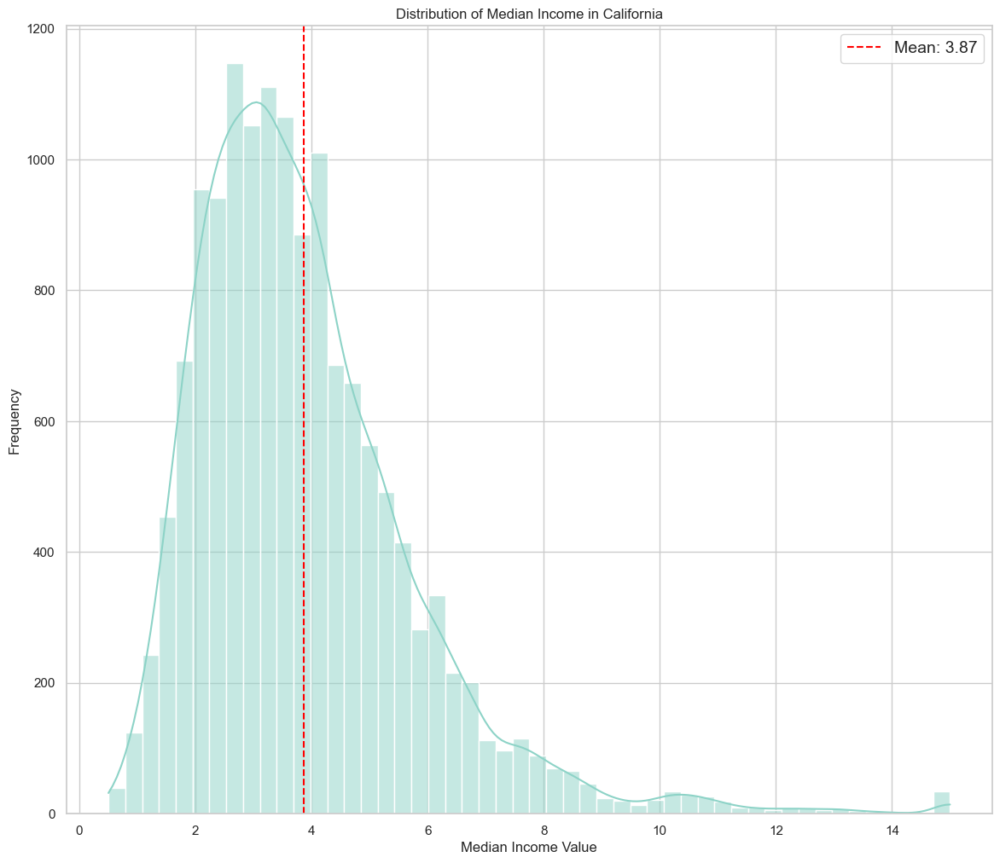

In [18]:
plt.figure(figsize=(14, 12))
sns.histplot(data=df, x='median_income', kde=True, bins=50)

plt.xlabel('Median Income Value')
plt.ylabel('Frequency')
plt.title('Distribution of Median Income in California')

mean = df['median_income'].mean()

plt.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')

plt.legend(fontsize=14)
plt.show()

In [19]:
print('Skewness median_house_value: ', df['median_house_value'].skew())
print('Skewness median_income: ', df['median_income'].skew())

Skewness median_house_value:  0.9817544310070773
Skewness median_income:  1.6290859142027518


Data `median_house_value` dan `median_income` menunjukan skew ke kanan

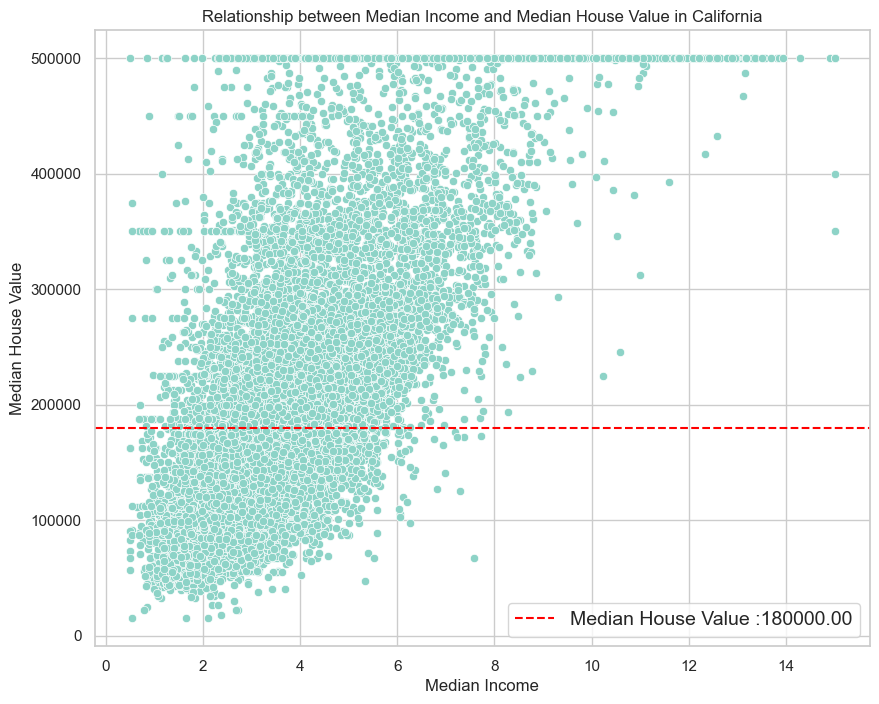

In [20]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='median_income',
                y='median_house_value')

plt.xlabel('Median Income')

plt.ylabel('Median House Value')

plt.title('Relationship between Median Income and Median House Value in California')

median_house_value = df['median_house_value'].median()
plt.axhline(median_house_value, color='red', linestyle='--',
            label=f'Median House Value :{median_house_value:.2f}')
plt.legend(fontsize=14)

plt.show()

Berdasarkan plot ini, pendapatan merupakan faktor penting yang mempengaruhi harga rumah. Tapi faktor lain seperti lokasi, supply rumah, dan kondisi ekonomi sekitar juga mempengaruhi penentuan harga rumah

## Missing Values

In [21]:
imp_knn = KNNImputer(n_neighbors=2)

# fit transform
df[['total_bedrooms']] = imp_knn.fit_transform(df[['total_bedrooms']])

Menggunakan Multivariate Imputation untuk mengisi data NaN daripada men-drop data

[Reference](https://datascience.stackexchange.com/questions/104510/drop-or-impute-the-missing-values)

## Preprocessing

- Onehot encoder: memiliki sedikit nilai unik
- Robust Scaler: banyak outlier

In [22]:
scaler = RobustScaler()
transformer = ColumnTransformer([
    ('onehot', OneHotEncoder(drop='first'), ['ocean_proximity']),
    ('robust', scaler, ['housing_median_age',
     'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income'])
],remainder='passthrough')

In [23]:
X = df.drop(columns=['median_house_value'])
y = df['median_house_value']

In [24]:
X = transformer.fit_transform(X)

## Data Split

In [25]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=0,
)

`test_size` menggunakan metode 80/20 sesuai dengan Pareto Principle

[Reference](https://scholarworks.utep.edu/cs_techrep/1209/#:~:text=Empirical%20studies%20show%20that%20the,of%20the%20data%20for%20training.)

[Reference 2](https://www.r-bloggers.com/2021/01/what-is-a-good-test-set-size-2/)

[Reference 3](https://en.wikipedia.org/wiki/Pareto_principle)

## Modelling

Evaluation Metrics: Accuracy vs. Error

Regression Metrics:

- Mean Absolute Error (MAE): The average absolute difference between predicted values and actual values.
- Mean Squared Error (MSE): Similar to MAE but squares the differences before averaging, giving more weight to larger errors.
- R-squared: Indicates how well the independent variables explain the variability of the dependent variable.

In [26]:
# Define algoritma yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)

# Pemodelan dilakukan dalam skala logaritmik, namun kemudian di-inverse kembali untuk interpretasi
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)

# Kandidat algoritma
models = [log_lr, log_knn, log_dt, log_rf, log_xgb]

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

# Mencari algoritma terbaik berdasarkan tiap metrics
for model in models:

    crossval = KFold(n_splits=5, shuffle=True, random_state=1)

    # RMSE
    model_cv_rmse = cross_val_score(
        model,
        X_train,
        y_train,
        cv=crossval,
        scoring='neg_root_mean_squared_error',
        error_score='raise'
    )

    print(model_cv_rmse, model)

    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(model_cv_rmse.mean())
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        model,
        X_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_error',
        error_score='raise'
    )

    print(model_cv_mae, model)

    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(model_cv_mae.mean())
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        model,
        X_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_percentage_error',
        error_score='raise'
    )

    print(model_cv_mape, model)

    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(model_cv_mape.mean())
    nilai_std_mape.append(model_cv_mape.std())

[-84618.7496127  -76584.67734326 -92696.24052958 -95662.86601241
 -84193.35497283] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-51056.4626274  -49214.72691684 -52857.42603545 -54076.16234539
 -51208.68351171] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-0.26458519 -0.25837163 -0.25744735 -0.26387715 -0.25581725] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-60692.39724307 -62789.76402002 -58575.79915623 -61088.39489556
 -57832.39472502] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())
[-39687.13106682 -40692.62250426 -38552.29242128 -39728.48309817
 -38384.24020069] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,


In [27]:
pd.DataFrame({
    'Model': ['Linear Regression', 'KNN Regressor', 'DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
0,Linear Regression,-86751.177694,6770.663140,-51682.692287,1662.311600,-0.260020,0.003542
1,KNN Regressor,-60195.750008,1787.851841,-39408.953858,849.846290,-0.203625,0.006159
2,DecisionTree Regressor,-70367.691339,1591.709355,-45196.649735,982.939625,-0.245272,0.007319
3,RandomForest Regressor,-51026.294649,1909.514861,-32647.133267,600.920824,-0.171064,0.005789
4,XGBoost Regressor,-50275.784647,2097.674726,-32356.406347,897.067593,-0.167743,0.008747


- Berdasarkan nilai RMSE, model Linear Regression adalah model terbaik. Sedangkan jika berdasarkan nilai MAE dan MAPE, RandomForest memiliki nilai paling rendah.
- Selanjutnya, akan dilakukan prediksi pada test set dengan 2 benchmark model terbaik, yaitu Linear Regression dan RandomForest. 

In [28]:
models = {
    'LinearRegression': lr,
    'RandomForest': rf
}

score_rmse = []
score_mae = []
score_mape = []

for i in models:

    model = Pipeline([
        ('model', models[i])
    ])

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    score_mae.append(mean_absolute_error(y_test, y_pred))
    score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

score_before_tuning = pd.DataFrame(
    {'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape}, index=models.keys())
score_before_tuning

,RMSE,MAE,MAPE
LinearRegression,67919.206467,49497.886357,0.287555
RandomForest,50242.461778,33191.392830,0.186983


- Dari ketiga metric, RandomForest lebih baik LinearRegression mengindikasi model lebih akurat dan reliable
- Meski RandomForest lebih baik, beberapa hal yang perlu diperhatikan dibanding LinearRegression adalah:
    - RandomForest lebih kompleks 
    - RandomForest memerlukan lebih banyak waktu untuk training
    - Performa akan memburuk jika model overfitting dengan data yang ditrain, cross validation sudah membantu

In [29]:
# Define the parameter grid
# jumlah pohon; semakin tinggi, semakin tinggi performa namun meningkatkan cost komputasi
n_estimators = [100, 200, 500] # reasonable value 100. 200 dan 500 untuk melihat peningkatkan performa

# mengkontrol percabangan, menggunakan semua fitur akan mengarah ke overfitting
max_features = ['sqrt', 'log2'] # sqrt good starting point. log2 untuk handle high dimensional data

# mengkontrol kompleksitas
max_depth = [None, 10, 20] # None pohon dapat tumbuh tanpa batas, dapat mengarah ke overfitting. Spesific value untuk melimitasi

# mengkontrol seberapa sering split terjadi
min_samples_split = [2, 5, 10] # Semakin tinggi akan menghindari model belajar pattern tertentu

# sama dengan min_samples_split
min_samples_leaf = [1, 2, 4] # Semakin tinggi akan membuat generalisasi lebih baik

param_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf
}

# Create the grid search object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3,  # Reduced cv for speed, increase for better validation
                           # Use a negative scoring metric because GridSearchCV maximizes
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,  # Use all available cores for parallel processing
                           verbose=2)  # Show progress during fitting

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 162 candidates, totalling 486 fits
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   2.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   4.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   2.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   4.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=1), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 500]},
             scoring='neg_mean_squared_error', verbose=2)

Menggunakan GridSearch dengan menguji setiap kombinasi untuk mendapatkan kombinasi terbaik untuk menghasilkan best performance model 

In [30]:
best_rf_regressor = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_  

print("Best Parameters:", best_params)
print("Best Score (Negative MSE):", best_score)

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
Best Score (Negative MSE): -2728490283.403931


In [31]:
model = {'RandomForest': rf}

# Evaluate on the test set (using RMSE for better interpretability):
y_pred = best_rf_regressor.predict(X_test)

rmse_rf_tuning = np.sqrt(mean_squared_error(y_test, y_pred))
mae_rf_tuning = mean_absolute_error(y_test, y_pred)
mape_rf_tuning = mean_absolute_percentage_error(y_test, y_pred)

score_after_tuning = pd.DataFrame(
    {'RMSE': rmse_rf_tuning, 'MAE': mae_rf_tuning, 'MAPE': mape_rf_tuning}, index=model.keys())

In [32]:
print("Before Tuning:")
pd.DataFrame(score_before_tuning.loc['RandomForest']).T

Before Tuning:


,RMSE,MAE,MAPE
RandomForest,50242.461778,33191.39283,0.186983


In [33]:
print("After Tuning:")
score_after_tuning

After Tuning:


,RMSE,MAE,MAPE
RandomForest,49919.153865,34146.704343,0.195025


- RMSE, MAE & MAPE sebelum tuning: 50242.461778, 33191.39283, 0.186983
- RMSE, MAE & MAPE setelah tuning: 49919.153865, 34146.704343, 0.195025

RMSE setelah tuning lebih rendah, yang berarti model membuat kesalahan prediksi yang lebih kecil secara rata-rata. Ini adalah indikasi positif.

MAE setelah tuning lebih tinggi, yang berarti rata-rata selisih absolut antara prediksi dan nilai sebenarnya meningkat. Ini adalah indikasi negatif.

MAPE setelah tuning meningkat, ini berarti kesalahan prediksi dalam persentase, rata rata meningkat. Ini merupakan indikasi yang kurang baik.

Secara umum, tuning tampaknya memberikan hasil yang beragam. RMSE menurun, yang bagus, tetapi MAE dan MAPE meningkat, yang kurang bagus. Dalam kasus ini, fokus kepada RMSE, karena RMSE lebih sensitif kepada outlier, dan dengan menurunnya nilai RMSE, model setelah tuning, lebih baik dari model sebelumnya.

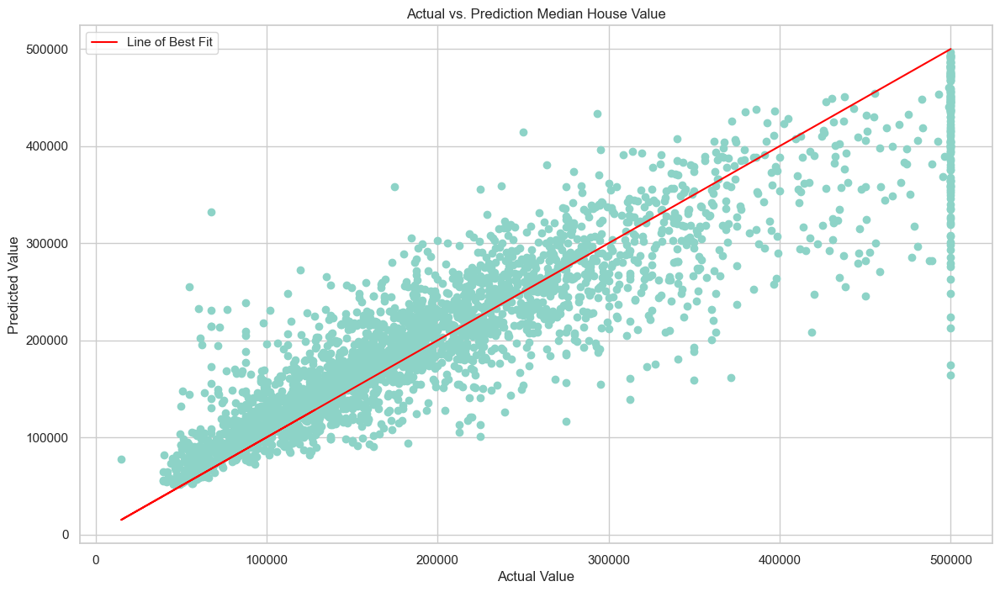

In [34]:
slope = 1
intercept = -0.2
line = slope * y_test + intercept
plt.figure(figsize=(14, 8))
plt.scatter(x=y_test, y=y_pred)
plt.xlabel('Actual Value')
plt.ylabel('Predicted Value')
plt.title('Actual vs. Prediction Median House Value')
plt.plot(y_test, line, color='red', linestyle='-', label='Line of Best Fit')
plt.legend()
plt.show()

Dari visualisasi scatter plot, terlihat bahwa titik-titik tersebar di sekitar garis merah, mengindikasikan bahwa model tidak memprediksi nilai secara sempurna, namun sebagian besar titik terkonsentrasi di sekitar garis tersebut, menunjukkan model cukup baik dalam memprediksi `median_house_value`. Meski demikian, terdapat beberapa titik yang jauh dari garis merah, mengindikasikan adanya prediksi yang kurang akurat atau outlier. Selain itu, terlihat adanya kecenderungan *underestimation* pada prediksi nilai-nilai di atas 300.000, di mana banyak nilai prediksi yang berada di bawah nilai aktualnya. Dengan nilai MAPE sekitar 19,5% setelah *tuning*, model ini dapat dikategorikan sebagai 'Good Forecasting', menunjukkan bahwa secara keseluruhan, model memiliki tingkat akurasi yang cukup baik dalam memprediksi `median_house_value`.

*Source: Lewis, C. D. (1982). Industrial and business forecasting methods: A practical guide to exponential smoothing and curve fitting*

<Axes: title={'center': 'Feature Importances'}>

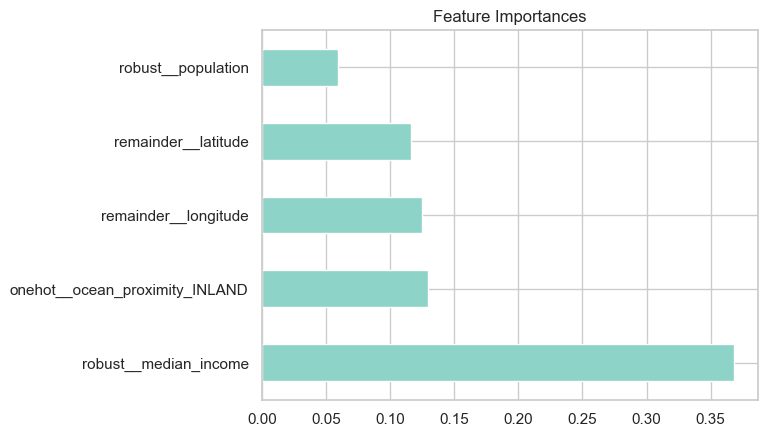

In [35]:
# Plot feature importances
feature_imp = pd.Series(best_rf_regressor.feature_importances_,
                        transformer.get_feature_names_out()).sort_values(ascending=False).head()
feature_imp.plot(kind='barh', title='Feature Importances')

Plot ini menunjukkan bahwa `media_income` adalah faktor yang paling penting dalam memprediksi target model kita. Lokasi `latitude` dan `longitude` juga memiliki pengaruh yang signifikan, meskipun tidak sebesar `media_income`. `population` memiliki pengaruh yang paling kecil.

## Conclusion

- Model: Berdasarkan penghitungan RMSE, MAE dan MAPE model yang terpilih untuk digunakan adalah *Random Forest Regressor* setelah dibandingkan dengan model Linear Regression, KNN Regressor, DecisionTree Regressor, dan XGBoost Regressor. Umumnya model RF sering digunakan dan perform lebih baik pada jenis tipe data ini.

- Feature Importance: Pada model yang dijalankan, Random Forest Regressor, `media_income`, `ocean_proximity`, `latitude`, `longitude`, dan `population` adalah yang paling mempengaruhi dalam memprediksi target yaitu `median_house_value`. 


## Recommendation/Improvements

- Feature Engineering: Eksplorasi fitur-fitur baru seperti rasio kamar tidur (`rooms_bedroom_ratio`), jarak ke pusat bisnis (`distance_to_cbd`), luas ruangan (`spacious_room`), dan fitur-fitur lain yang berpotensi mempengaruhi median_house_value sangat penting. Penambahan fitur-fitur yang relevan dapat meningkatkan akurasi model.

- Models: Selain model regresi yang telah digunakan, disarankan untuk mengeksplorasi model regresi lainnya seperti Gradient Boosting, atau Support Vector Regression. Model-model ini mungkin memberikan performa yang lebih baik dalam memprediksi harga rumah.

- Outlier: Identifikasi dan penanganan outlier dalam data sangat penting. Outlier dapat mempengaruhi performa model secara signifikan. Teknik-teknik seperti penghapusan outlier atau transformasi data dapat digunakan untuk mengatasi masalah ini.

- Data Scaling: Melakukan teknik untuk scaling yang lain seperti MinMaxScaler dapat memberikan hasil yang berbeda. Jika diperlukan, teknik scaling yang paling sesuai harus dipilih berdasarkan karakteristik data dan model yang digunakan.

## Deploy Model

In [36]:
# import joblib

# Save the model
# joblib.dump(rf_model, 'house_value_model.pkl')

In [37]:
# Save model
import pickle
filename = 'Model_CaliforniaHouses_RF.sav'

pickle.dump(best_rf_regressor, open(filename, 'wb'))

In [38]:
# Load model

loaded_model = pickle.load(open(filename, 'rb'))

In [39]:
np.sqrt(mean_squared_error(y_test, loaded_model.predict(X_test)))

np.float64(49919.15386530117)